## US Hate Crime Analysis 1991-2020

The purpose of this analysis is to review the raw data on hate crimes at the Country, Regional, and State Level to identify the trends in reporting. Additionaly a review of how those numbers compare to per capita reporting will be reviewed. This analysis is aimed at identifying trends that may affect reporting in United States by identifying discrepancies per capita and at the State Level. 

### Step One: 
Import Data set and review data

In [96]:
import pandas as pd
df= pd.read_csv('/Users/kristydewit/Desktop/hate_crime.csv',low_memory=False)
df.head()    

,Unnamed: 0.2,Unnamed: 0.1,Unnamed: 0,INCIDENT_ID,DATA_YEAR,ORI,PUB_AGENCY_NAME,PUB_AGENCY_UNIT,AGENCY_TYPE_NAME,STATE_ABBR,...,OFFENSE_NAME,TOTAL_INDIVIDUAL_VICTIMS,LOCATION_NAME,BIAS_DESC,VICTIM_TYPES,MULTIPLE_OFFENSE,MULTIPLE_BIAS,Populations,Counts,PER_CAPITA
0,0,0,0,3015,1991,AR0040200,Rogers,NaN,City,AR,...,Intimidation,1.0,Highway/Road/Alley/Street/Sidewalk,Anti-Black or African American,Individual,S,S,3017804,1119,37.079943
1,1,1,1,3016,1991,AR0290100,Hope,NaN,City,AR,...,Simple Assault,1.0,Highway/Road/Alley/Street/Sidewalk,Anti-White,Individual,S,S,3017804,1119,37.079943
2,2,2,2,43,1991,AR0350100,Pine Bluff,NaN,City,AR,...,Aggravated Assault,1.0,Residence/Home,Anti-Black or African American,Individual,S,S,3017804,1119,37.079943
3,3,3,3,44,1991,AR0350100,Pine Bluff,NaN,City,AR,...,Aggravated Assault;Destruction/Damage/Vandalis...,1.0,Highway/Road/Alley/Street/Sidewalk,Anti-White,Individual,M,S,3017804,1119,37.079943
4,4,4,4,3017,1991,AR0350100,Pine Bluff,NaN,City,AR,...,Aggravated Assault,1.0,Service/Gas Station,Anti-White,Individual,S,S,3017804,1119,37.079943


### Step Two:
Import librabries that will be used for analysis and visualization

In [72]:
import matplotlib as plt
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

### History of Hate Crime Reporting in the United States 1991-2020
The chart below shows over the reporting period highs and lows, overall reporting has increased since 1991 to 2020. The peak years are 2020 with the most reported crimes(10299), 2001(9730), and 1996(8790). This leads to questions about what was going on in the United States during 2020,2001 and 1996 that resulted in higher reporting since there is no clear trend line shown in the line chart. 

The lowest reporting years are 1991(4589), 2014(5599), and 2015(5871). Again there is no clear trend in reporting when looking at the lowest reporting years. 

1991    4589
2014    5599
2015    5870
1994    5954
2013    6044
Name: DATA_YEAR, dtype: int64

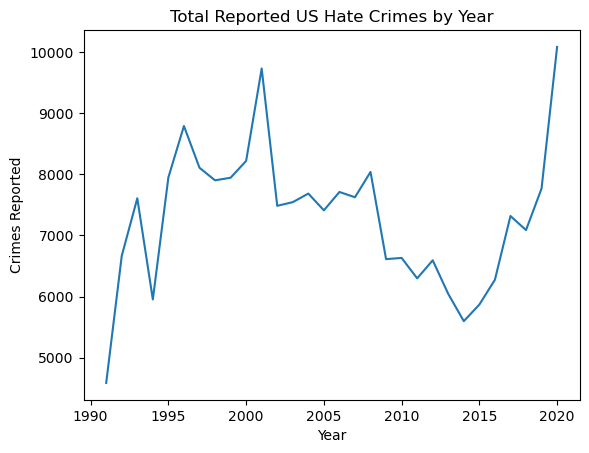

In [73]:
# Review of all Hate Crimes in the United States by year
df['DATA_YEAR'].value_counts()
US_YEAR= df['DATA_YEAR'].value_counts().sort_index()
US_YEAR.plot(kind='line', title='Total Reported US Hate Crimes by Year', xlabel='Year', ylabel='Crimes Reported')
df['DATA_YEAR'].value_counts().head(5)
df['DATA_YEAR'].value_counts(ascending=True).head(5)


## Reporting by State and Year
The dataframe below shows the counts by year for each state. Additionally line charts have been created by use of a function to compare overall data for the United States and by State. This information will be used later to analyze the states that are impacting the overall numbers by year in the United States. 

In [74]:
df.groupby(by=['STATE_NAME','DATA_YEAR'])['Unnamed: 0'].count().reset_index()


,STATE_NAME,DATA_YEAR,Unnamed: 0
0,Alabama,1992,4
1,Alabama,1993,5
2,Alabama,2002,2
3,Alabama,2003,1
4,Alabama,2004,3
...,...,...,...
1429,Wyoming,2015,2
1430,Wyoming,2016,3
1431,Wyoming,2017,4
1432,Wyoming,2019,5


In [75]:
# Rename the Unnamed column
STATE_YEAR=df.groupby(by=['STATE_NAME','DATA_YEAR'])['Unnamed: 0'].count().reset_index()
STATE_YEAR.rename(columns={'Unnamed: 0':'COUNT'}, inplace=True)
print(STATE_YEAR)


     STATE_NAME  DATA_YEAR  COUNT
0       Alabama       1992      4
1       Alabama       1993      5
2       Alabama       2002      2
3       Alabama       2003      1
4       Alabama       2004      3
...         ...        ...    ...
1429    Wyoming       2015      2
1430    Wyoming       2016      3
1431    Wyoming       2017      4
1432    Wyoming       2019      5
1433    Wyoming       2020     18

[1434 rows x 3 columns]


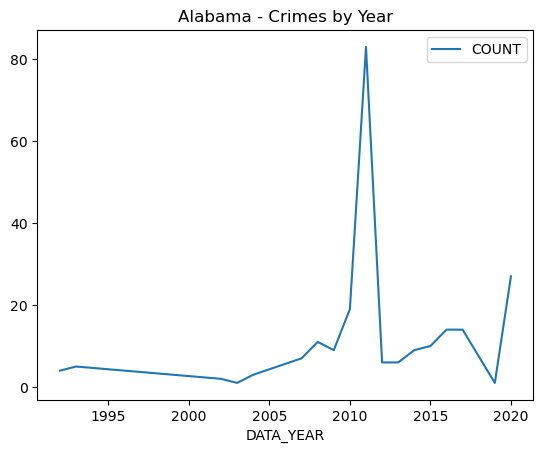

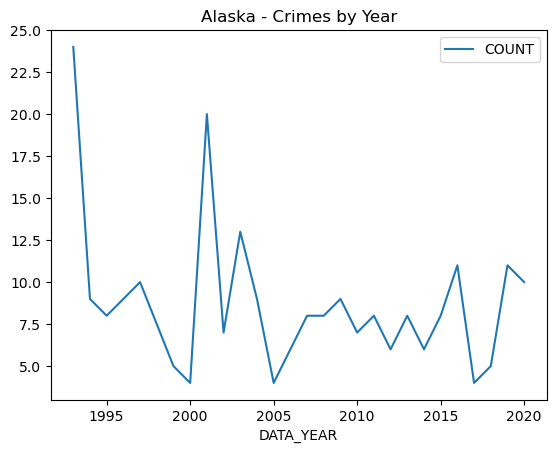

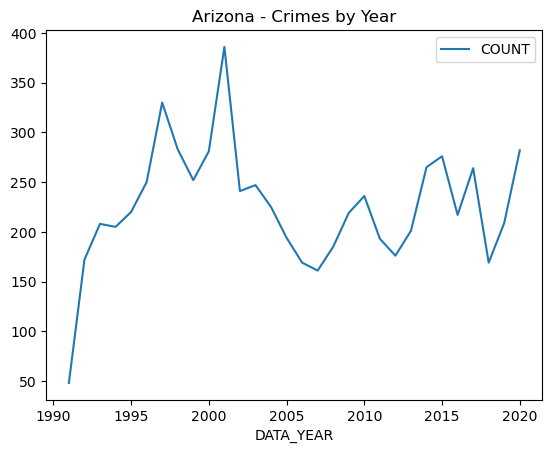

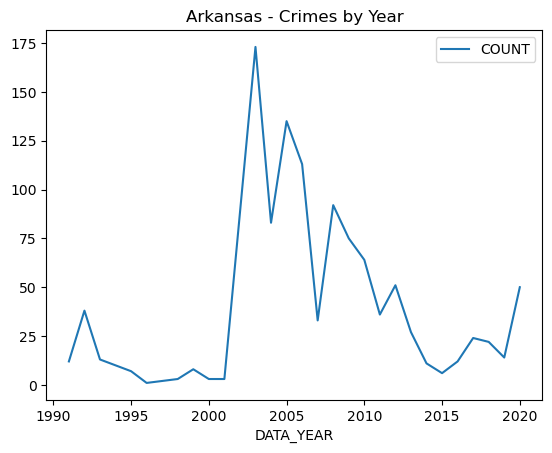

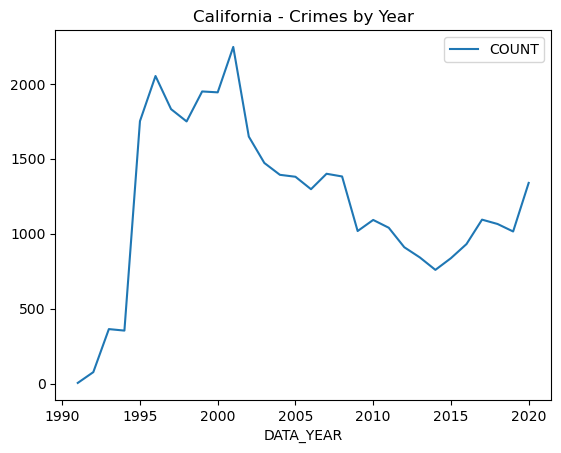

...

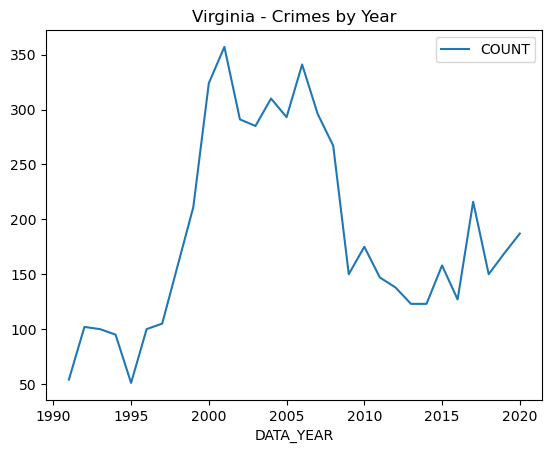

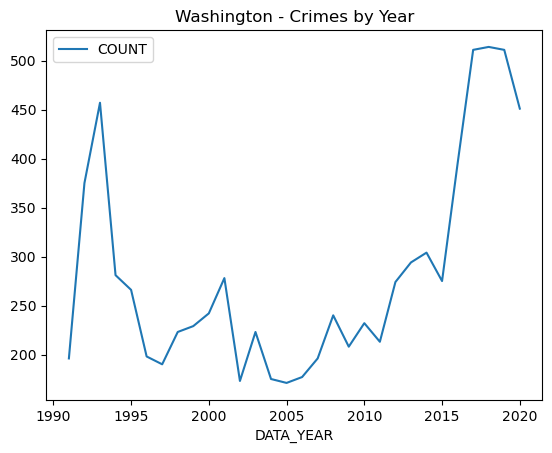

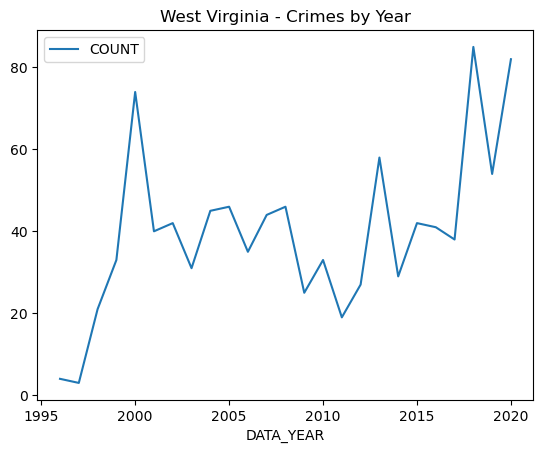

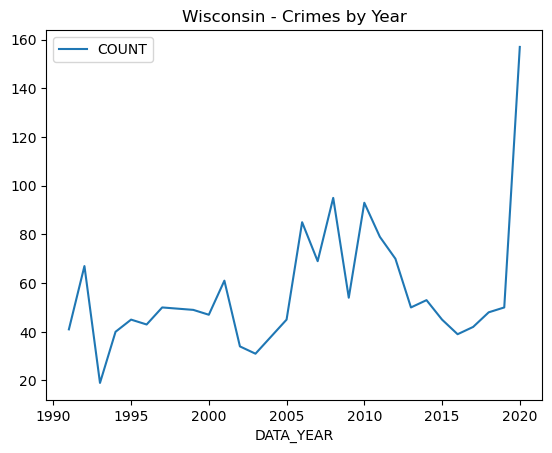

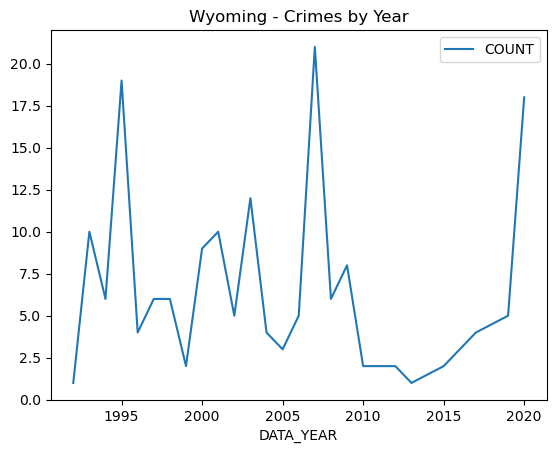

In [76]:
def state_linecharts(df, element):
    levels = df[element].unique()
    for level in levels:
        data_filtered = df[df[element] == level]
        
        # Create plots
        #fig,ax =plt.subplots()
    
        data_filtered.plot.line(x='DATA_YEAR', y='COUNT', title=level + ' - Crimes by Year')
        #ax.set_title(level + 'Crimes by Year')
        plt.show()

state_linecharts(STATE_YEAR,'STATE_NAME')    
    

            





## US Categorical Data

The following sections will show the data for all years 1991-2020 for the following categories:


<li> Offender Ethnicity </li>
<li> Offense Names </li>
<li> Offender Race </li>
<li> Locations </li>
<li> Bias Description </li>
<li> Top States by raw count </li>

###  Offender Ethnicity 
In the majority of the  US reportings, 72.7% the offender ethnicity is unknown. 

Unknown                   0.729331
Not Hispanic or Latino    0.211217
Hispanic or Latino        0.053588
Multiple                  0.005864
Name: OFFENDER_ETHNICITY, dtype: float64

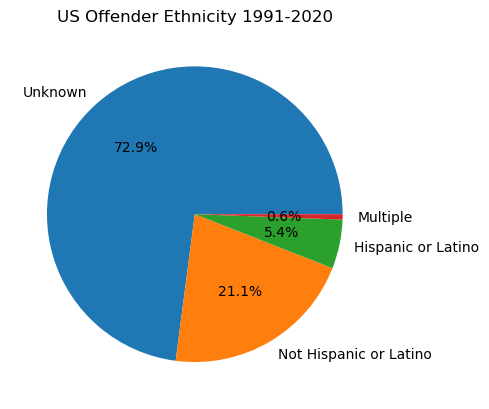

In [77]:
US_OFFENDERS=(df['OFFENDER_ETHNICITY'].value_counts(normalize=True))
US_OFFENDERS.plot(kind='pie', title= 'US Offender Ethnicity 1991-2020', ylabel='',autopct='%1.1f%%')
US_OFFENDERS.head(4)

### Offense Names
In the US the highest reported Hate Crime is Destruction/Damage/Vandalism of Property, followed closely by Intimidation. 

<AxesSubplot:title={'center':'Top 5 US Reported Hate Crimes 1991-2020'}>

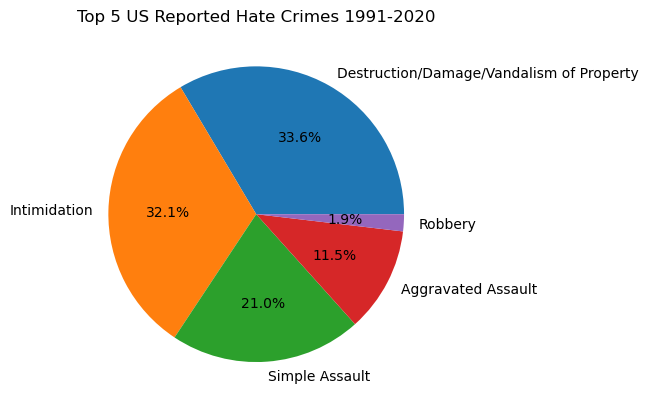

In [78]:
US_OFFENSES=df['OFFENSE_NAME'].value_counts(normalize=True)[0:5]
US_OFFENSES.plot(kind='pie', title='Top 5 US Reported Hate Crimes 1991-2020', ylabel='',autopct='%1.1f%%')

### Offender Race
In the US the offender race is often Unknown in reporting, 44.6% of reportings. White offenders make up 39.6% of hate crime reporting. 

Unknown                      0.443370
White                        0.393399
Black or African American    0.129934
Multiple                     0.020166
Asian                        0.007242
Name: OFFENDER_RACE, dtype: float64


<AxesSubplot:title={'center':' US Offender Race 1991-2020'}>

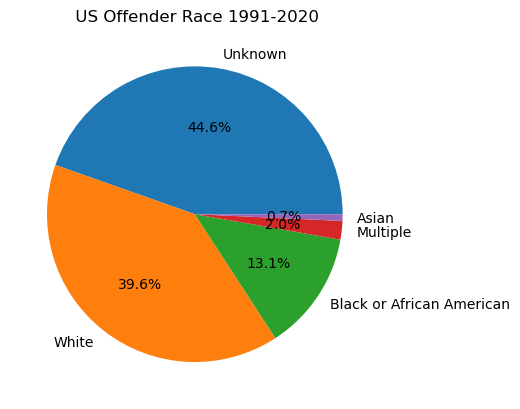

In [79]:
US_RACE=df['OFFENDER_RACE'].value_counts(normalize=True)[0:5]
print(US_RACE)
US_RACE.plot(kind='pie',ylabel='',autopct='%1.1f%%', title=' US Offender Race 1991-2020')


### Location Description
In the US the top location of the hate crime is a residence/home.

Residence/Home                        0.296665
Highway/Road/Alley/Street/Sidewalk    0.189171
Other/Unknown                         0.133824
School/College                        0.079755
Parking/Drop Lot/Garage               0.057035
Church/Synagogue/Temple/Mosque        0.037263
Commercial/Office Building            0.022565
Restaurant                            0.020384
Bar/Nightclub                         0.017367
Government/Public Building            0.014698
Name: LOCATION_NAME, dtype: float64


<AxesSubplot:title={'center':'Top 10 US Hate Crime Locations'}>

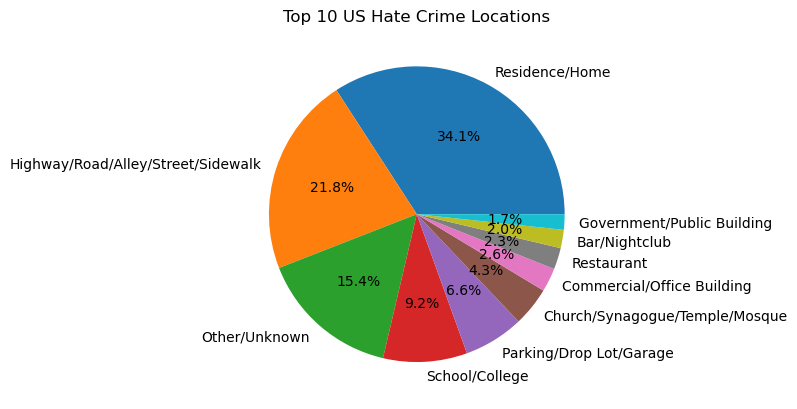

In [80]:
US_LOCATIONS=df['LOCATION_NAME'].value_counts(normalize=True)[0:10]
print(US_LOCATIONS)
US_LOCATIONS.plot(kind='pie',ylabel='',autopct='%1.1f%%', title='Top 10 US Hate Crime Locations')

### Crime Bias
In the US the top Crime Bias is Anti-Black or African American historically from 1991-2020. 

<AxesSubplot:title={'center':'Top 10 US Crime Bias'}>

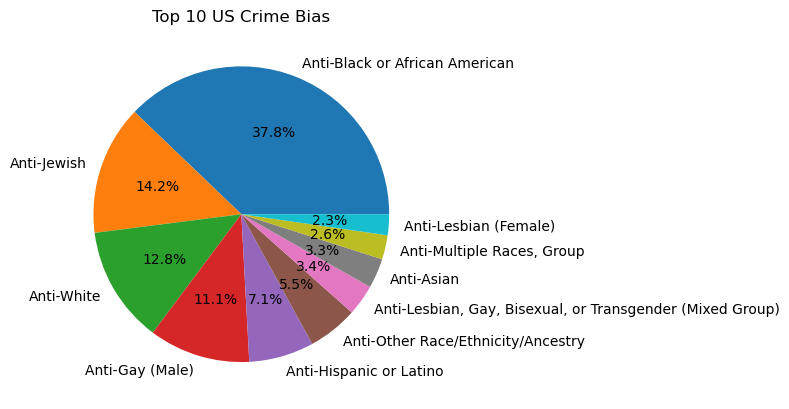

In [81]:
US_BIAS=df['BIAS_DESC'].value_counts(normalize=True)[0:10]
US_BIAS.plot(kind='pie',ylabel='',autopct='%1.1f%%',title='Top 10 US Crime Bias')

### Top States
When considering raw counts of reporting hate crimes in the US California tops with 26.1% of all reported hate crime in the total reporting period of 1991-2020. 

<AxesSubplot:title={'center':'Top 10 States by Reporting Totals'}>

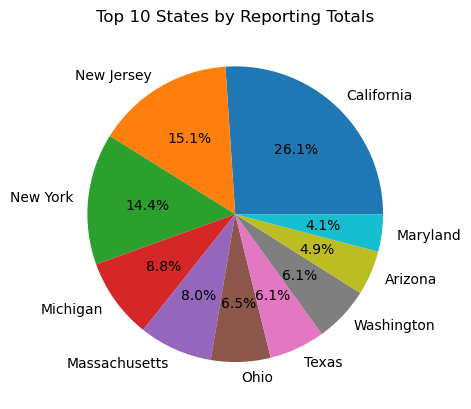

In [102]:
US_STATE=df['STATE_NAME'].value_counts(normalize=True)[0:10]
US_STATE.plot(kind='pie', title='Top 10 States by Reporting Totals', autopct= '%1.1f%%',ylabel='')


### Crimes by Region

Below you will see how the Regions are defined and the crime count for each state in that region for the entire reporting period of 1991-2020. 

It comes as no surprise that the West Region, housing California, has the highest percentage of reported hate crime in raw counts. 

REGION_NAME  STATE_NAME          
Midwest      Michigan                12229
             Ohio                     9051
             Illinois                 5513
             Minnesota                4738
             Missouri                 3229
             Indiana                  2131
             Kansas                   1849
             Wisconsin                1639
             Nebraska                 1133
             Iowa                      880
             South Dakota              583
             North Dakota              433
Northeast    New Jersey              20960
             New York                20006
             Massachusetts           11178
             Connecticut              3658
             Pennsylvania             3520
             Maine                    1323
             Rhode Island              876
             New Hampshire             661
             Vermont                   582
South        Texas                    8483
             Marylan

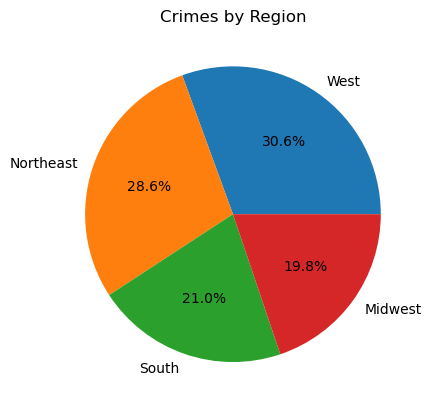

In [83]:
US_REGIONS=df['REGION_NAME'].value_counts(normalize=True)[0:4]
US_REGIONS.plot(kind='pie',ylabel='',autopct='%1.1f%%',title='Crimes by Region')


REGIONS=df.groupby('REGION_NAME')['STATE_NAME'].value_counts()
print(REGIONS)


## Per Capita vs Raw Numbers

To continue my analysis I have located census data to merge with the current dataframe adding in each states population for the given census year. With this I can added a new column for per capita crime rate for each state.

The Census Year pulled is 2019.

As seen the Top 5 States by raw count and per capita are very different. 
Per Capita the District of Columbia leads, whereas in raw counts California leads. 

This analysis allows us to view a more realistic view of how the states are reporting when considering per capita. 

In [84]:
populations= pd.read_csv('/Users/kristydewit/Desktop/2019_Census_US_Population_Data_By_State_Lat_Long.csv')
populations.head()

,STATE_NAME,Populations
0,Alabama,4903185
1,Alaska,731545
2,Arizona,7278717
3,Arkansas,3017804
4,California,39512223


In [85]:
#merge tables to add Populations
df1= df.merge(populations)
df=df1
df.head()

,Unnamed: 0.1,Unnamed: 0,INCIDENT_ID,DATA_YEAR,ORI,PUB_AGENCY_NAME,PUB_AGENCY_UNIT,AGENCY_TYPE_NAME,STATE_ABBR,STATE_NAME,...,OFFENSE_NAME,TOTAL_INDIVIDUAL_VICTIMS,LOCATION_NAME,BIAS_DESC,VICTIM_TYPES,MULTIPLE_OFFENSE,MULTIPLE_BIAS,Populations,Counts,PER_CAPITA
0,0,0,3015,1991,AR0040200,Rogers,NaN,City,AR,Arkansas,...,Intimidation,1.0,Highway/Road/Alley/Street/Sidewalk,Anti-Black or African American,Individual,S,S,3017804,1119,37.079943
1,1,1,3016,1991,AR0290100,Hope,NaN,City,AR,Arkansas,...,Simple Assault,1.0,Highway/Road/Alley/Street/Sidewalk,Anti-White,Individual,S,S,3017804,1119,37.079943
2,2,2,43,1991,AR0350100,Pine Bluff,NaN,City,AR,Arkansas,...,Aggravated Assault,1.0,Residence/Home,Anti-Black or African American,Individual,S,S,3017804,1119,37.079943
3,3,3,44,1991,AR0350100,Pine Bluff,NaN,City,AR,Arkansas,...,Aggravated Assault;Destruction/Damage/Vandalis...,1.0,Highway/Road/Alley/Street/Sidewalk,Anti-White,Individual,M,S,3017804,1119,37.079943
4,4,4,3017,1991,AR0350100,Pine Bluff,NaN,City,AR,Arkansas,...,Aggravated Assault,1.0,Service/Gas Station,Anti-White,Individual,S,S,3017804,1119,37.079943


In [86]:
#add per capita for each state state report totals/state population *100000

df['Counts'] = df.groupby(['STATE_NAME'])['Populations'].transform('count')
df.head()
PER_CAPITA= df['Counts']/df['Populations']* 100000
df['PER_CAPITA']=PER_CAPITA
df.head()

,Unnamed: 0.1,Unnamed: 0,INCIDENT_ID,DATA_YEAR,ORI,PUB_AGENCY_NAME,PUB_AGENCY_UNIT,AGENCY_TYPE_NAME,STATE_ABBR,STATE_NAME,...,OFFENSE_NAME,TOTAL_INDIVIDUAL_VICTIMS,LOCATION_NAME,BIAS_DESC,VICTIM_TYPES,MULTIPLE_OFFENSE,MULTIPLE_BIAS,Populations,Counts,PER_CAPITA
0,0,0,3015,1991,AR0040200,Rogers,NaN,City,AR,Arkansas,...,Intimidation,1.0,Highway/Road/Alley/Street/Sidewalk,Anti-Black or African American,Individual,S,S,3017804,1119,37.079943
1,1,1,3016,1991,AR0290100,Hope,NaN,City,AR,Arkansas,...,Simple Assault,1.0,Highway/Road/Alley/Street/Sidewalk,Anti-White,Individual,S,S,3017804,1119,37.079943
2,2,2,43,1991,AR0350100,Pine Bluff,NaN,City,AR,Arkansas,...,Aggravated Assault,1.0,Residence/Home,Anti-Black or African American,Individual,S,S,3017804,1119,37.079943
3,3,3,44,1991,AR0350100,Pine Bluff,NaN,City,AR,Arkansas,...,Aggravated Assault;Destruction/Damage/Vandalis...,1.0,Highway/Road/Alley/Street/Sidewalk,Anti-White,Individual,M,S,3017804,1119,37.079943
4,4,4,3017,1991,AR0350100,Pine Bluff,NaN,City,AR,Arkansas,...,Aggravated Assault,1.0,Service/Gas Station,Anti-White,Individual,S,S,3017804,1119,37.079943


<AxesSubplot:title={'center':'Top 5 States Per Capita Hate Crimes'}, xlabel='STATE_NAME'>

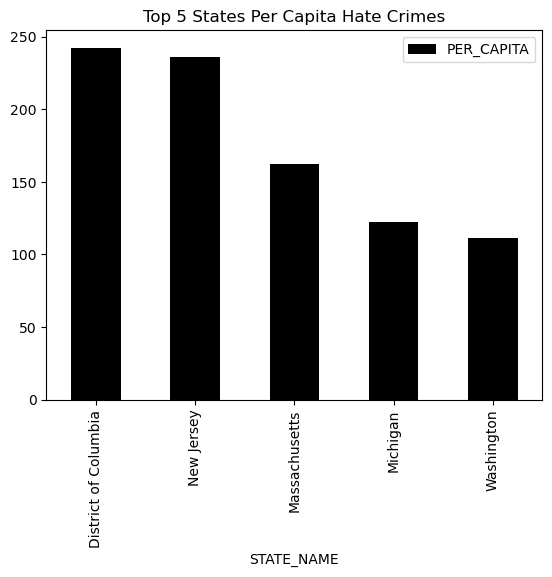

In [87]:
PERCAPITA=df.groupby(by=['PER_CAPITA','STATE_NAME'])['Unnamed: 0'].count().reset_index()
PERCAPITA.rename(columns={'Unnamed: 0':'COUNT'}, inplace=True)
PERCAPITA=PERCAPITA.sort_values(by='PER_CAPITA',ascending=False)[0:5]
PERCAPITA.plot(kind='bar',color='black', x='STATE_NAME',y='PER_CAPITA', title='Top 5 States Per Capita Hate Crimes')

### State Analysis

The followng shows the Top 10 Crime Bias for the State of California for all reporting years. 
To quickly access all Categorical Data for all States I have created a function to run pie charts for this. This information is useful to drill down state by state looking for deviations from the US and Regional Trends. 



<AxesSubplot:title={'center':'CA Hate Crime Bias Top 10'}>

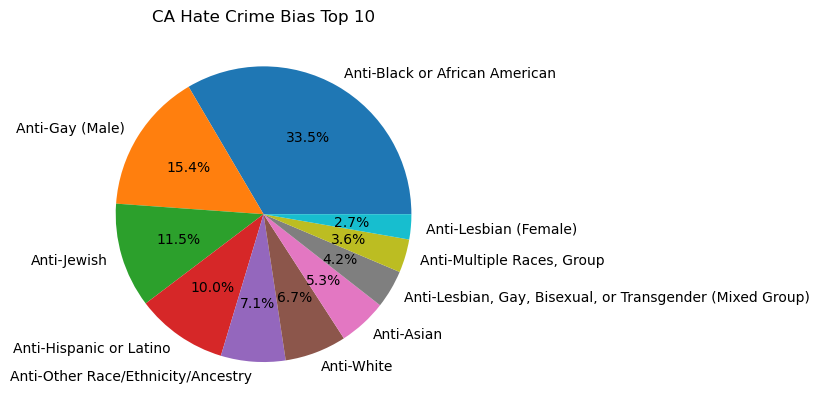

In [88]:
CA=df[df.STATE_NAME =='California']
CA_BIAS=CA.BIAS_DESC.value_counts(normalize=True)[0:10]
CA_BIAS.plot(kind='pie', ylabel="",title= 'CA Hate Crime Bias Top 10', autopct='%1.1f%%')


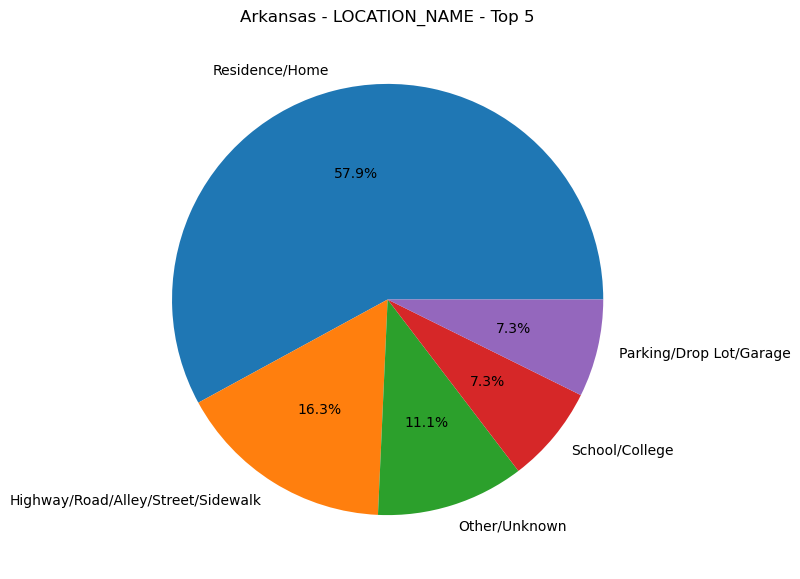

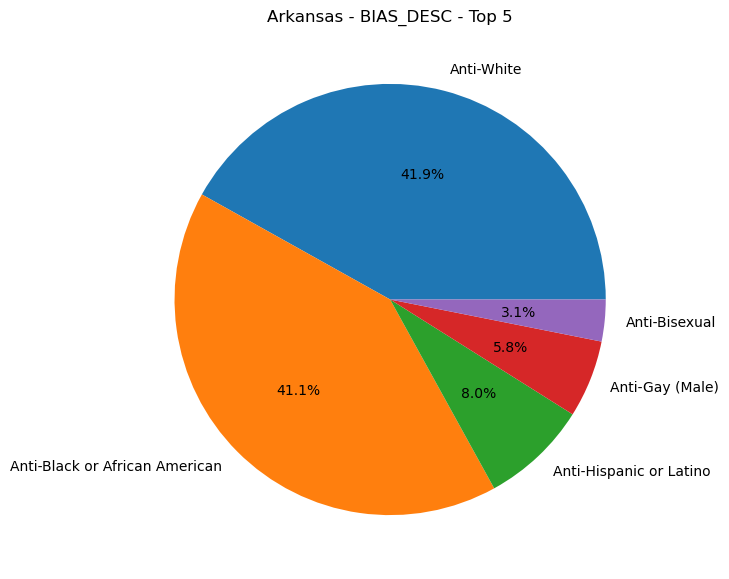

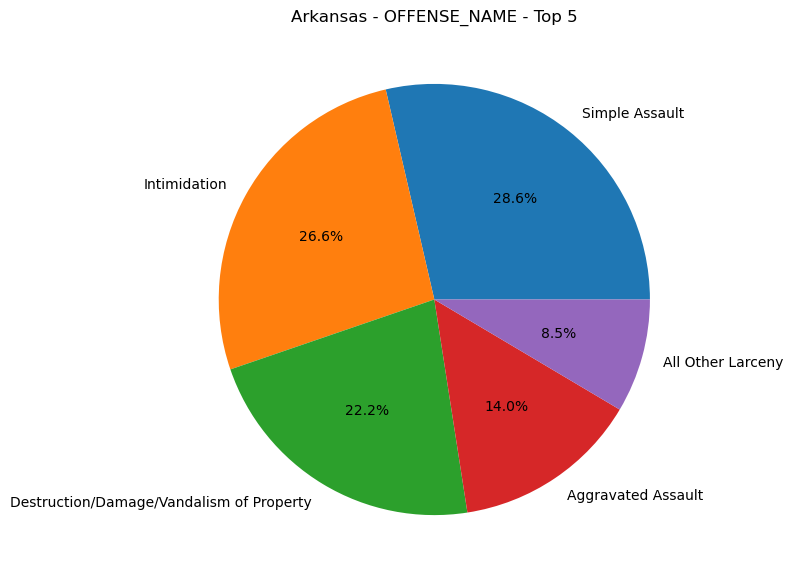

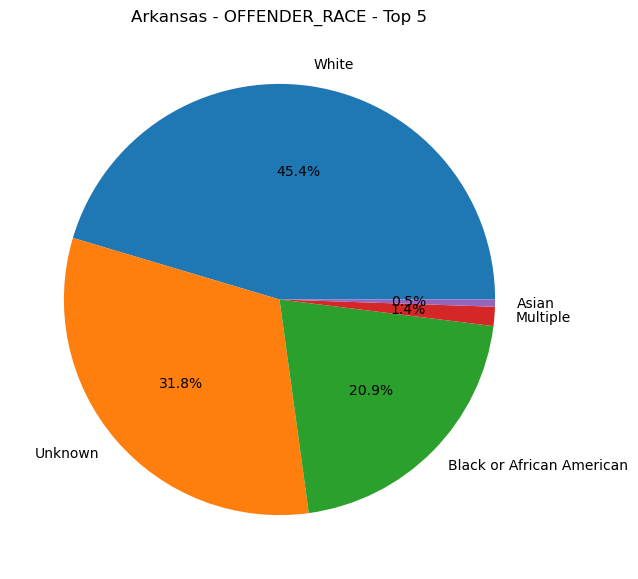

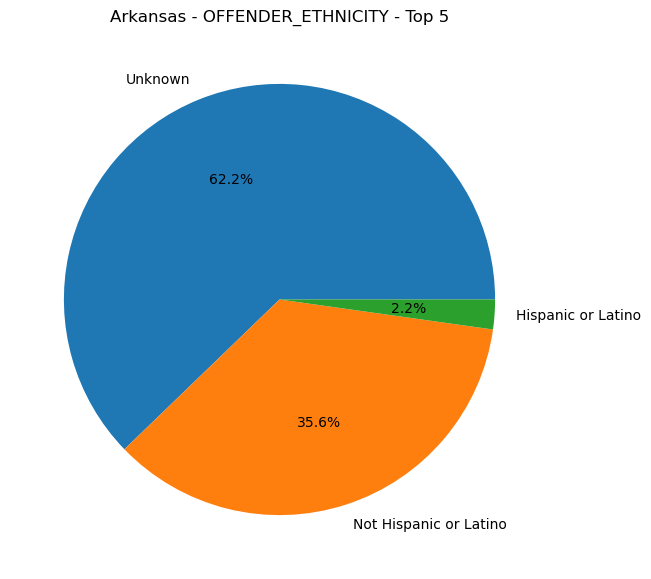

...

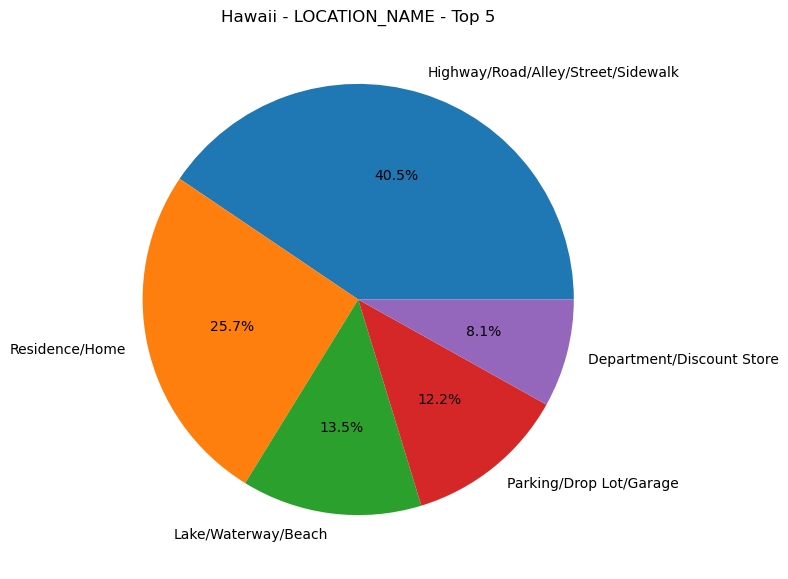

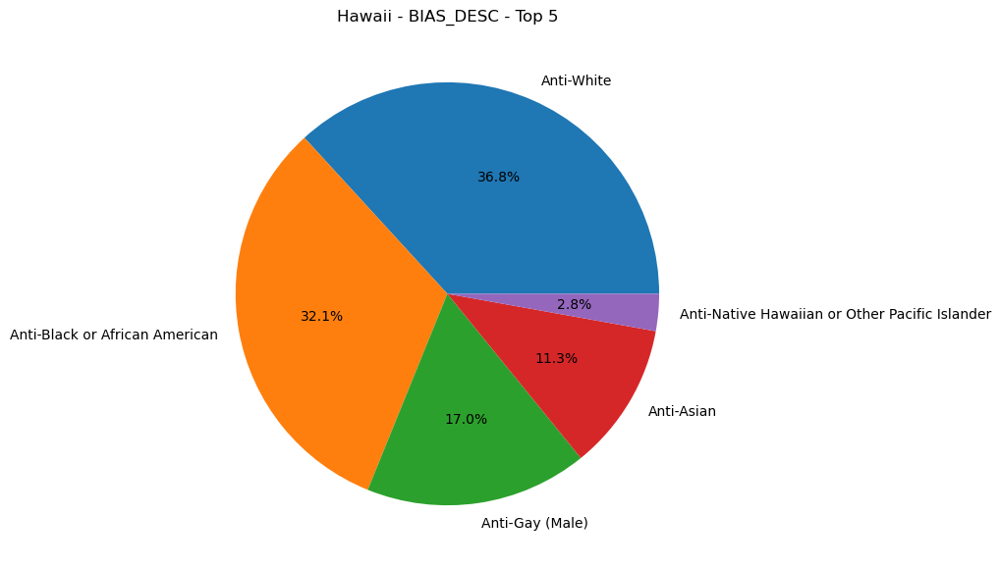

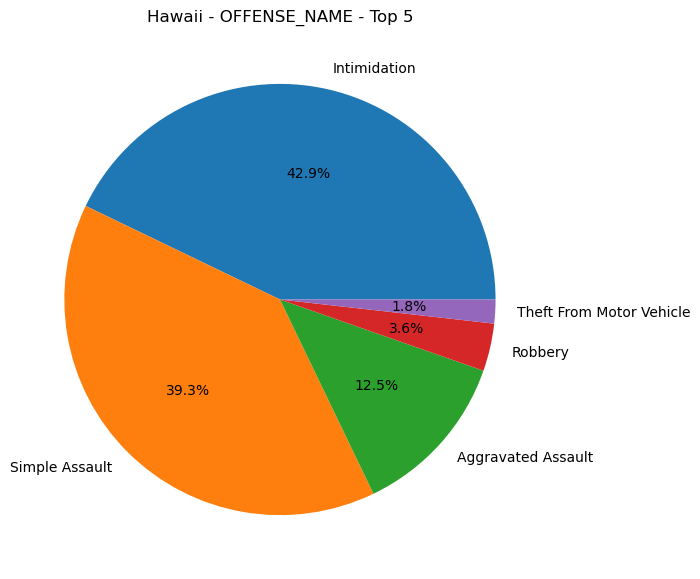

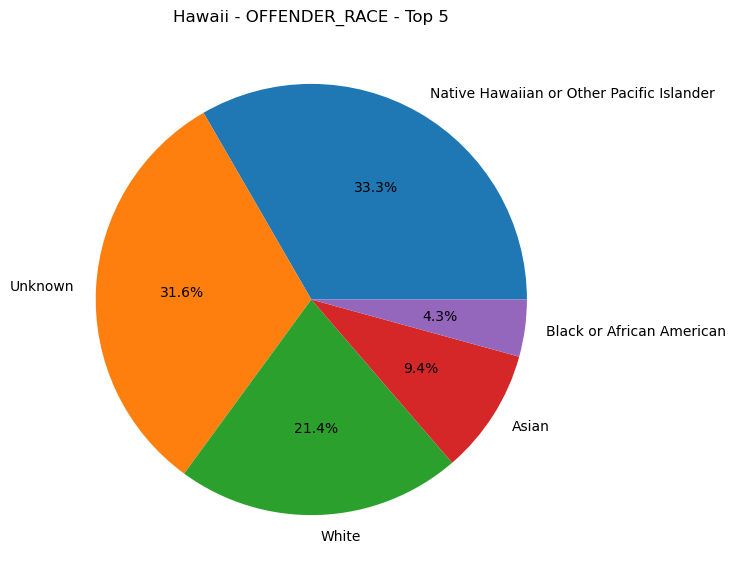

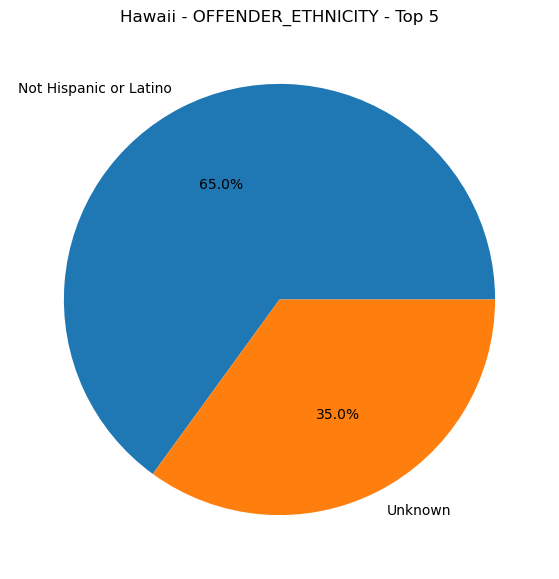

In [89]:
def state_piecharts(dataframe, element, category_labels):
    levels = dataframe[element].unique()
    for level in levels:
        data_filtered = dataframe[dataframe[element] == level]
        for category in category_labels:

            # Filter data & creating labels for pie chart
            data_bias = data_filtered[category].value_counts(normalize=True)[0:5]
            labels = data_bias.index.tolist()

            # Creating plot
            fig,ax = plt.subplots(figsize =(10, 7))
            ax.set_title(level+' - '+category+' - Top 5')
            ax.pie(data_bias, labels=labels, autopct='%1.1f%%')
            ax.patch.set_facecolor('#FFFFFF')

            # show plot
            plt.show()

CAT_DATA=['LOCATION_NAME','BIAS_DESC', 'OFFENSE_NAME','OFFENDER_RACE','OFFENDER_ETHNICITY']
state_piecharts(df, 'STATE_NAME', CAT_DATA)
   

## Function defined piece by piece

In [97]:
# list of all categorical data to iterate
CAT_DATA

['LOCATION_NAME',
 'BIAS_DESC',
 'OFFENSE_NAME',
 'OFFENDER_RACE',
 'OFFENDER_ETHNICITY']

In [98]:
# define levels
levels = df['STATE_NAME'].unique()

In [92]:
levels

array(['Arkansas', 'Arizona', 'New Jersey', 'California', 'Colorado',
       'Delaware', 'Connecticut', 'District of Columbia', 'Illinois',
       'Iowa', 'Georgia', 'Idaho', 'Maryland', 'Massachusetts', 'Kansas',
       'Minnesota', 'Missouri', 'Mississippi', 'New York', 'Nevada',
       'Pennsylvania', 'Texas', 'Ohio', 'Oregon', 'Oklahoma', 'Virginia',
       'Tennessee', 'Washington', 'Wisconsin', 'Alabama', 'Florida',
       'Indiana', 'Kentucky', 'Louisiana', 'Michigan', 'Maine',
       'North Carolina', 'North Dakota', 'Rhode Island', 'Utah',
       'South Carolina', 'Wyoming', 'Alaska', 'Montana', 'New Mexico',
       'South Dakota', 'Vermont', 'New Hampshire', 'Nebraska',
       'West Virginia', 'Hawaii'], dtype=object)

In [99]:
# example of how the function will work for each state
df[df['STATE_NAME']=='Arkansas']['LOCATION_NAME'].value_counts(normalize=True)[5:]

Convenience Store                                              0.022341
Church/Synagogue/Temple/Mosque                                 0.019660
Restaurant                                                     0.018767
Department/Discount Store                                      0.016086
Commercial/Office Building                                     0.016086
Jail/Prison/Penitentiary/Corrections Facility                  0.016086
Grocery/Supermarket                                            0.016086
Service/Gas Station                                            0.013405
Bar/Nightclub                                                  0.010724
Field/Woods                                                    0.009830
Government/Public Building                                     0.008937
Specialty Store                                                0.008043
Hotel/Motel/Etc.                                               0.007149
Rental Storage Facility                                        0

In [100]:
# example of how the fuction will iterate through Categorical Data
i=0
for category in CAT_DATA:
    print("Level: "+str(i)+" Category: "+category)
    i+=1

Level: 0 Category: LOCATION_NAME
Level: 1 Category: BIAS_DESC
Level: 2 Category: OFFENSE_NAME
Level: 3 Category: OFFENDER_RACE
Level: 4 Category: OFFENDER_ETHNICITY


## Export to Tableau

To furhter analyze and visualize this analysis the new dataframe will be exported to Tableau. Summary and visulaization will be completed in Tableau.

In [95]:
df.to_csv('/Users/kristydewit/Desktop/hate_crime.csv')